In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture

In [2]:
#implement these clustering algorithms
#kmeans
#DBSCAN
#hierarchical
#Gaussian Mixture Model

In [3]:
df = pd.read_csv('../Clustering/csv_files/cleaned_players.csv')
df.head()

,Height (in),Weight (lbs),40 Yard,Bench Press,Vert Leap (in),Broad Jump (in),Shuttle,3Cone,ProBowl,POS_C,...,POS_DT,POS_K,POS_LB,POS_OG,POS_OT,POS_QB,POS_RB,POS_S,POS_TE,POS_WR
0,-1.488834,-0.933303,-1.289143,-0.991468,-0.050021,0.496894,0.719184,-0.839898,0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.400950,0.575394,0.501981,0.977647,-1.364373,-1.062715,0.719184,1.249482,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.476541,0.863821,1.023035,0.485368,-1.125400,-0.854767,-0.340479,1.249482,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-0.619533,-0.844556,-0.572694,-1.976025,-0.050021,0.080999,0.405210,-0.736719,0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,1.043476,0.730701,0.143756,-0.171003,-0.886427,-0.542845,0.287470,0.114510,0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
#df.drop(['ProBowl'], axis=1, inplace=True)
df.tail()

,Height (in),Weight (lbs),40 Yard,Bench Press,Vert Leap (in),Broad Jump (in),Shuttle,3Cone,ProBowl,POS_C,...,POS_DT,POS_K,POS_LB,POS_OG,POS_OT,POS_QB,POS_RB,POS_S,POS_TE,POS_WR
12220,0.854498,0.841634,-0.084205,0.649461,0.002553,0.184972,0.405210,0.475637,0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12221,1.376078,2.061904,0.632245,0.682280,-0.766940,0.080999,1.190146,1.455840,0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
12222,0.336697,1.396302,1.055601,1.634019,-0.408481,-0.750793,0.444457,0.862559,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12223,0.620165,1.196622,0.990470,0.813554,-1.483859,-0.542845,0.954665,0.965739,0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12224,0.242208,0.220406,-1.354275,0.485368,1.383818,1.952529,-0.301232,-0.298207,0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
df.describe()

,Height (in),Weight (lbs),40 Yard,Bench Press,Vert Leap (in),Broad Jump (in),Shuttle,3Cone,ProBowl,POS_C,...,POS_DT,POS_K,POS_LB,POS_OG,POS_OT,POS_QB,POS_RB,POS_S,POS_TE,POS_WR
count,1.222500e+04,1.222500e+04,1.222500e+04,1.222500e+04,1.222500e+04,1.222500e+04,1.222500e+04,1.222500e+04,12225.000000,12225.000000,...,12225.000000,12225.000000,12225.000000,12225.000000,12225.000000,12225.000000,12225.000000,12225.000000,12225.000000,12225.000000
mean,5.498351e-16,-1.069447e-16,1.460027e-15,-4.301036e-16,-1.859907e-15,8.648569e-16,-1.487926e-16,-1.255437e-16,0.065685,0.030920,...,0.073211,0.027321,0.120573,0.062658,0.075992,0.052025,0.109448,0.078282,0.057751,0.133415
std,1.000041e+00,1.000041e+00,1.000041e+00,1.000041e+00,1.000041e+00,1.000041e+00,1.000041e+00,1.000041e+00,0.247741,0.173109,...,0.260493,0.163024,0.325643,0.242358,0.264996,0.222086,0.312213,0.268626,0.233281,0.340037
min,-4.625876e+00,-2.131386e+00,-1.973027e+00,-2.960583e+00,-3.515131e+00,-1.104421e+01,-2.695288e+00,-2.671330e+00,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-7.026840e-01,-8.223696e-01,-8.006549e-01,-6.632821e-01,-6.474536e-01,-5.428451e-01,-6.937006e-01,-7.367188e-01,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,6.078875e-02,-2.011414e-01,-2.144688e-01,-5.613830e-02,6.946562e-02,8.099855e-02,-1.442453e-01,-2.724122e-01,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,7.600088e-01,7.750742e-01,6.648105e-01,6.494612e-01,6.668983e-01,7.048422e-01,6.014441e-01,5.788166e-01,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,3.273422e+00,3.259987e+00,4.247059e+00,9.018199e+00,3.415089e+00,3.512138e+00,1.092335e+01,5.944137e+00,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


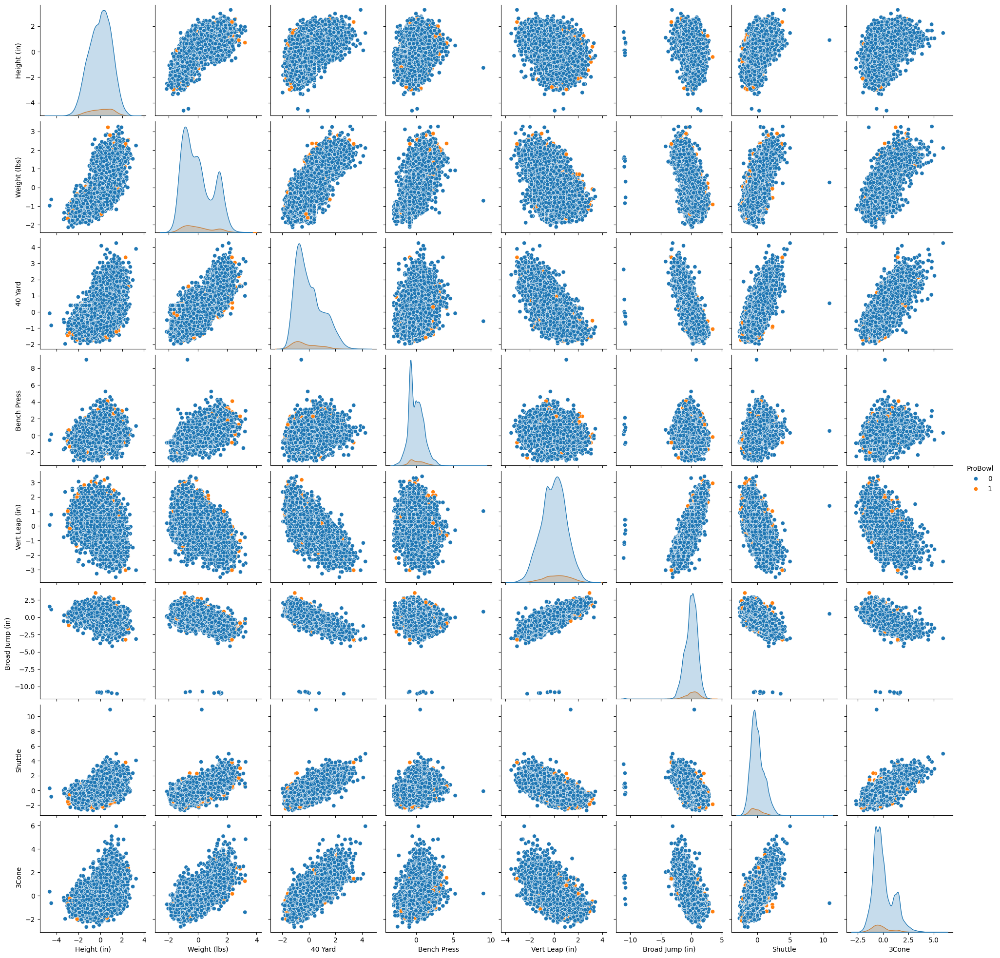

In [6]:
sns.pairplot(df, hue='ProBowl', vars=['Height (in)', 'Weight (lbs)', '40 Yard', 'Bench Press', 'Vert Leap (in)', 'Broad Jump (in)', 'Shuttle', '3Cone'])
plt.show()

In [7]:
df.drop(['ProBowl'], axis=1, inplace=True)

In [8]:
kmeans = KMeans(n_clusters=2, random_state=42)  # Number of clusters should be decided based on problem understanding or methods like the Elbow method
kmeans.fit(df)

# Assigning the clusters to each row in the dataframe
df['kmeans_cluster'] = kmeans.labels_

c:\Users\siyun\anaconda3\envs\'nfl_env'\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [9]:
def display_pairplot(df, hue_col):
    sns.pairplot(df, hue=hue_col, vars=['Height (in)', 'Weight (lbs)', '40 Yard', 'Bench Press', 'Vert Leap (in)', 'Broad Jump (in)', 'Shuttle', '3Cone'])
    plt.show()

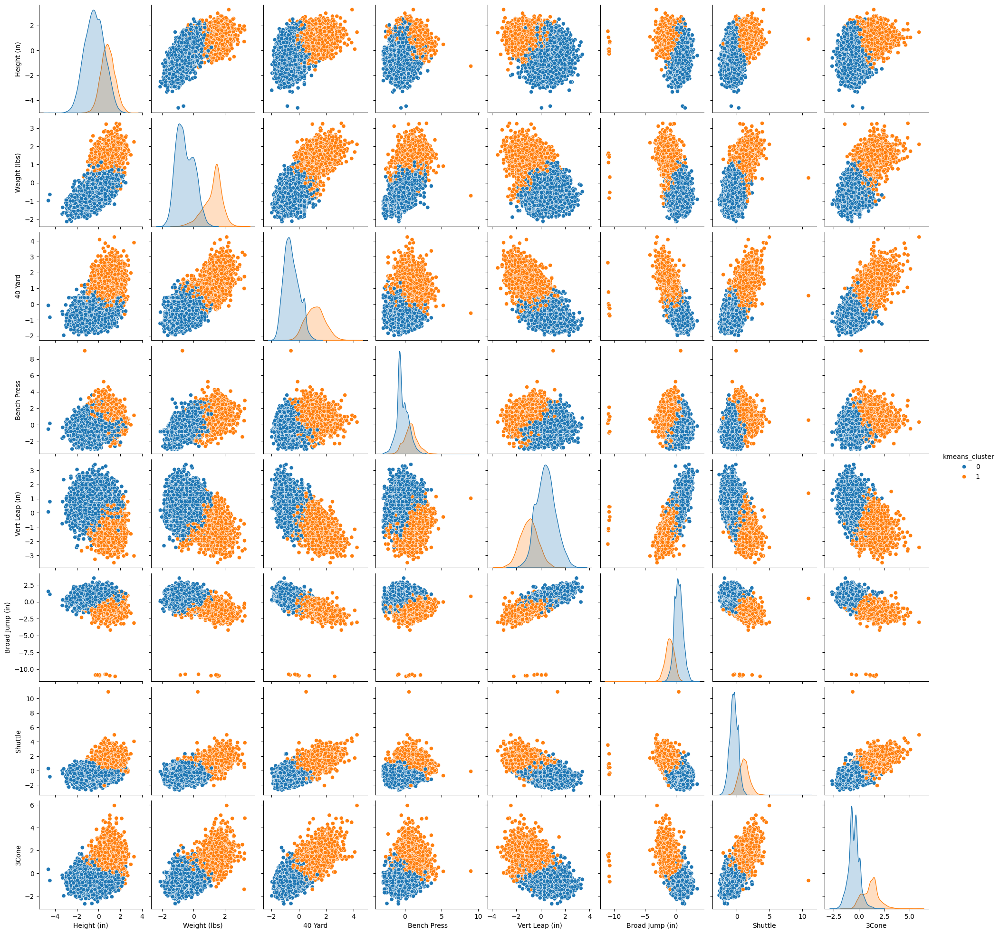

In [10]:
display_pairplot(df, 'kmeans_cluster')

In [11]:
def display_silhouette_plot(df, col, cluster_labels):
    silhouette_vals = silhouette_samples(df, df[col])

    # Silhouette plot
    sns.displot(silhouette_vals, kind='kde')
    plt.show()

    if len(set(cluster_labels)) > 1:
        silhouette_avg = silhouette_score(df, cluster_labels)
        print(f"The average silhouette_score is : {silhouette_avg}")

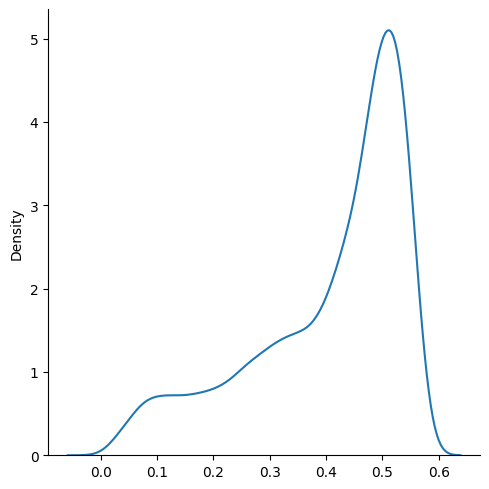

The average silhouette_score is : 0.40510734997496733


In [12]:
display_silhouette_plot(df, 'kmeans_cluster', kmeans.labels_)

In [13]:
df.drop(['kmeans_cluster'], axis=1, inplace=True)

In [14]:
dbscan = DBSCAN(eps=1, min_samples=25)
db_clusters = dbscan.fit_predict(df)

df['DBSCAN_cluster'] = db_clusters

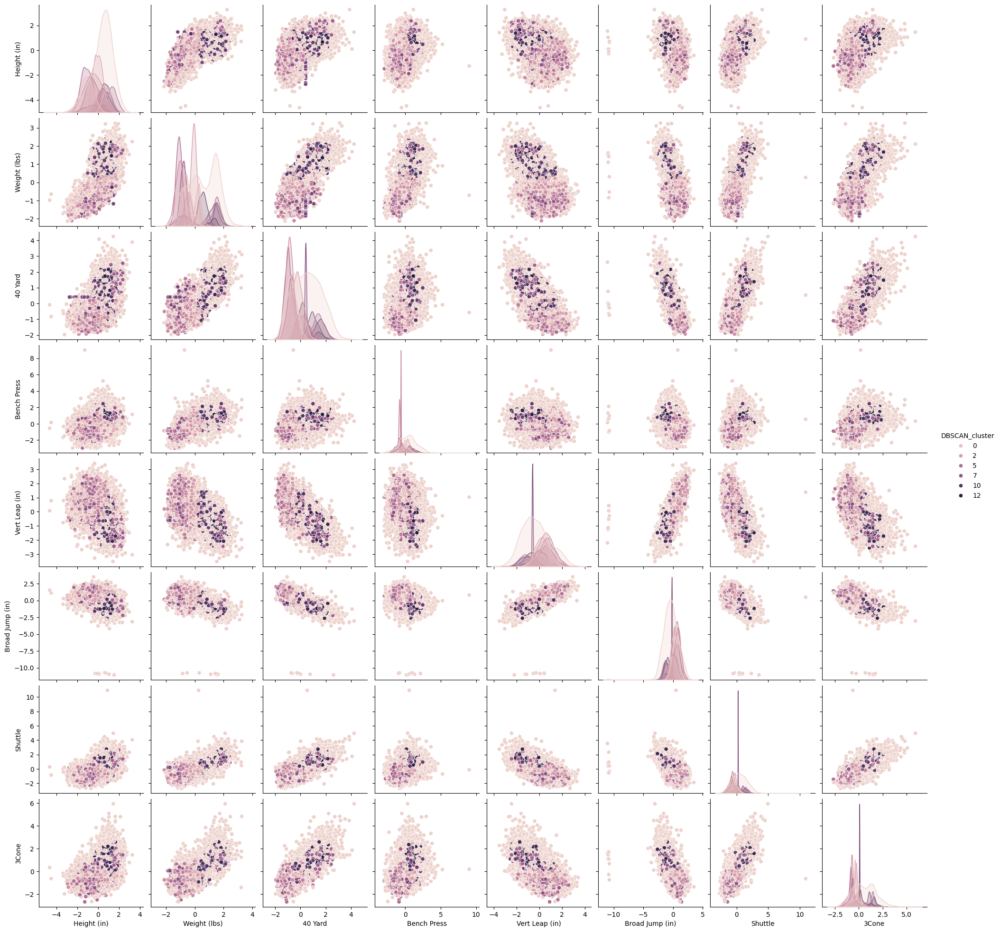

In [15]:
display_pairplot(df, 'DBSCAN_cluster')

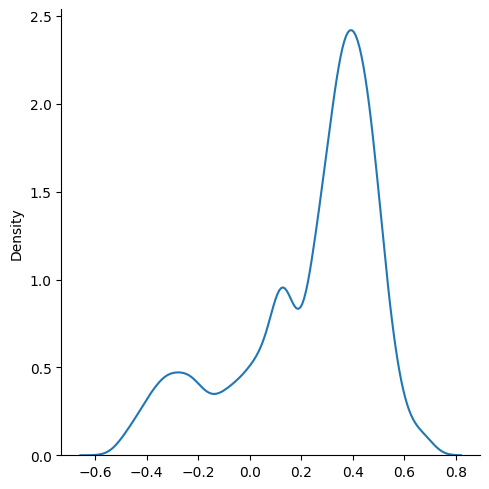

The average silhouette_score is : 0.23324651077000974


In [16]:
display_silhouette_plot(df, 'DBSCAN_cluster', db_clusters)

In [17]:
df.drop(['DBSCAN_cluster'], axis=1, inplace=True)

In [18]:
gmm = GaussianMixture(n_components=2, random_state=42)
gmm_clusters = gmm.fit_predict(df)

df['GMM_cluster'] = gmm_clusters

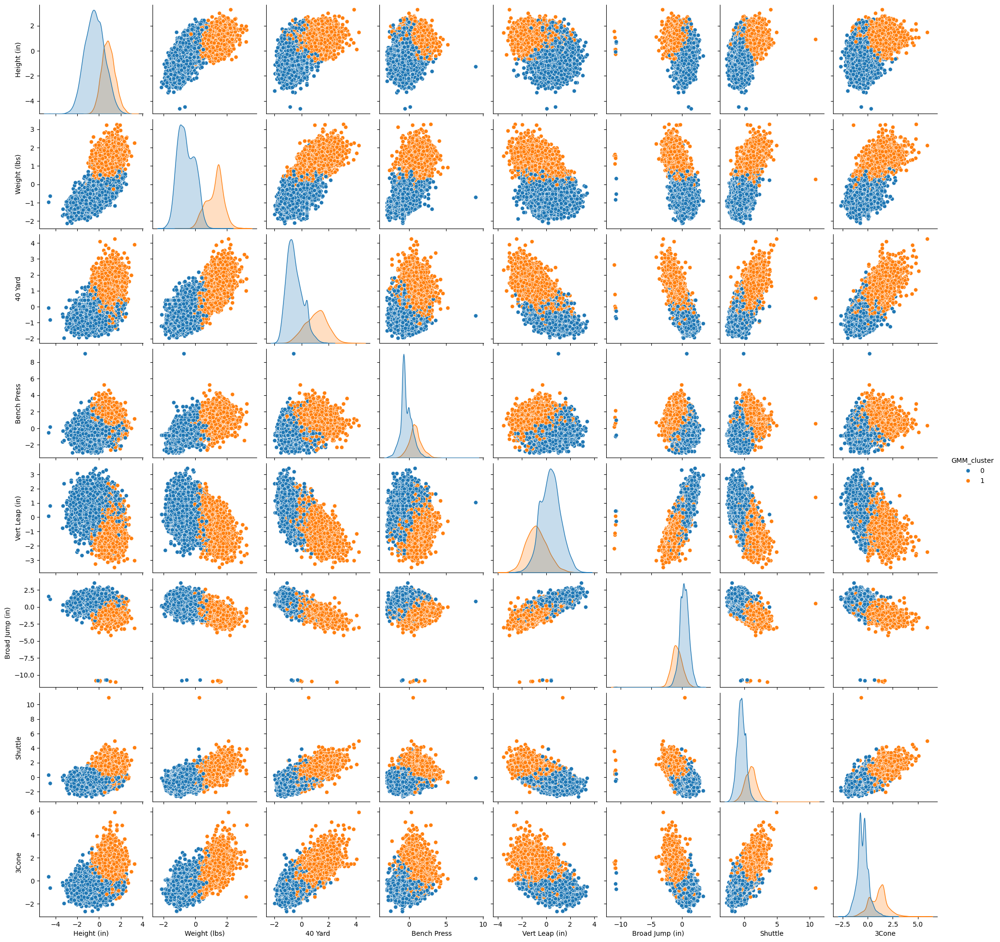

In [19]:
display_pairplot(df, 'GMM_cluster')

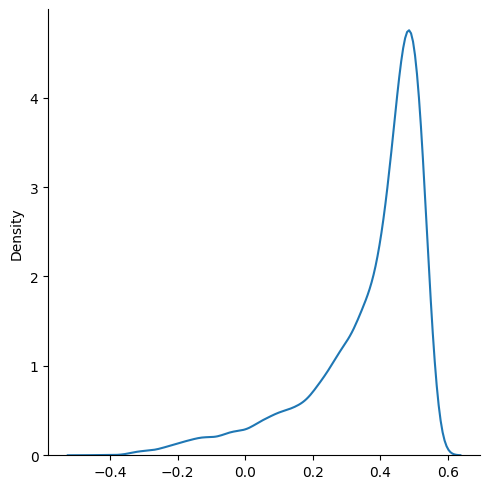

The average silhouette_score is : 0.36983661597730766


In [20]:
display_silhouette_plot(df, 'GMM_cluster', gmm_clusters)

In [21]:
df.drop(['GMM_cluster'], axis=1, inplace=True)